# Трансформеры

## Архитектура трансформеров

Трансформер — архитектура глубоких нейронных сетей, представленная в 2017 году
исследователями из Google Brain. По аналогии с рекуррентными нейронными сетями
(РНС) трансформеры предназначены для обработки последовательностей, таких как
текст на естественном языке, и решения таких задач как машинный перевод и
автоматическое реферирование.

Поразительные результаты применения моделей трансформеров в задачах NLP привели
к активному изучению возможности их применения в задачах CV. Среди своих важных
плюсов трансформеры позволяют определять длительные зависимости между элементами
входной последовательности и поддерживать параллельную обработку этой
последовательности в отличии от рекуррентных сетей (RNN, LSTM).

### Self-attention

Self-attention - механизм трансформеров (самая первая научная статья, которая
рассказывала про трансформеры и которая произвела настоящий фурор, называлась:
'Attention is all you need'). Этот механизм позволяет фокусироваться на
различных частях входной последовательности при обработке каждого элемента.

Для лучшего понимания лучше рассмотреть пример (из области NLP): задача перевода
с одного языка на другой.

**Пример:**

Пусть мы переводим предложение: "The cat sat on the mat.".

1. Кодируем входное значение

Сначала входное предложение кодируется в последовательность эмбеддингов слов.
Каждое слово представлено как многомерный вектор, отражающий его семантическое
значение.

    [Embedding for 'The', Embedding for 'cat', Embedding for 'sat', Embedding for 'on',
    Embedding for 'the', Embedding for 'mat', Embedding for '.']

2. Создание запросов, ключей и значений

Далее генерируется три версии входных эмбеддингов: запросы, ключи и значения.
Это линейные проекции исходных эмбеддингов, которые используются для расчета
значений внимания (attention scores).

    Queries: [Query for 'The', Query for 'cat', Query for 'sat',
              Query for 'on', Query for 'the', Query for 'mat', Query for '.']

    Keys: [Key for 'The', Key for 'cat', Key for 'sat', Key for 'on',
           Key for 'the', Key for 'mat', Key for '.']

    Values: [Value for 'The', Value for 'cat', Value for 'sat',
             Value for 'on', Value for 'the', Value for 'mat', Value for '.']

Пусть будет:

    Queries: [[0.23,0.4,.67,....],[0.4,0.6,.67,....],[0.2,0.2,.67,....],
          [0.5,0.3,.8,....], [0.1,0.4,.67,....], [0.2,0.4,.67,....],
          [0.7,0.4,.6,....]]
    Keys: [[0.1,0.4,.5,....],[0.2,0.4,.67,....],[0.3,0.4,.67,....],
          [0.4,0.4,.67,....], [0.5,0.4,.67,....], [0.6,0.7,.8,....],
          [0.6,0.4,.8,....]]
    Values: [[0.4,0.5,.67,....],[0.23,0.4,.5,....],[0.23,0.4,.8,....],
          [0.23,0.4,.45,....], [0.23,0.4,.9,....], [0.23,0.4,.6,....],
          [0.23,0.4,.10,....]]

3. Вычисление значений внимания (attention scores)

Значения внимания рассчитываются путем скалярного произведения запроса на ключи.
Эти оценки отражают важность или актуальность каждого слова для текущего
обрабатываемого слова.

    Attention scores for 'The': [0.9,0.7,0.5, 0.4,0.45,0.56,0.23]

    Attention scores for 'cat': [0.6,0.5,0.7, 0.23,0.44,0.58,0.23]

$\dots$

    Attention scores for '.': [0.3,0.5,0.9, 0.4,0.45,0.56,0.23]

4. Применение Softmax

Эта функция применяется к значениям внимания, чтобы преобразовать их в
вероятности. Это гарантирует, что весовые коэффициенты внимания в сумме будут
равны 1 и будут указывать относительную важность каждого слова в контексте
текущего слова.

    Softmax of attention scores 'The': [0.29, 0.1, 0.12, 0.14, 0.1, 0.1, 0.14]

5. Взвешенная сумма значений

Результаты softmax от значений внимания используются для вычисления взвешенной
суммы значений. Результирующий вектор представляет собой контекстно-зависимое
представление текущего слова с учетом его связи с другими словами в
последовательности.

    [0.29 * Value for 'The' + 0.1 * Value for 'cat' + 0.12 * Value for 'sat' + …]

Это выходное представление фиксирует контекстную информацию для всех слов,
учитывая их отношения с другими словами в предложении. После произведения будет
получена двумерная матрица.

Поскольку мы ищем связь между двумя словами/токенами **из одного и того же
предложения**, это процесс и называется **self**-attention.

Резюмируя:

**С помощью self-attention вычисляется взвешенная сумма входных данных, где веса - вычисленные значения "сходства" между входными признаками**

В рамках CV эти признаки уже относятся не к тексту, а к изображению.

### Query, keys и values

В алгоритме attention используются термины query, keys и values (запросы,
ключи и значения). Что они значат?

Концепция ключ/значение/запрос аналогична тому, как это работает в поисковой
системе. Например, когда вы ищете видео на Youtube, поисковая система
сопоставляет ваш запрос (текст в строке поиска) с набором ключей (название
видео, описание и т. д.), связанных с видео-кандидатами в их базе данных, а
затем представляет вам наиболее подходящие видео (значения). Attention можно
также рассматривать как процесс поиска.

* Query (Запрос):
    + Это вектор, который представляет текущий токен или позицию входной
      последовательности (например, предложения или текста), для которого мы
      хотим вычислить взвешенную сумму значений (values).
    + В контексте трансформеров, query обычно вычисляется путем умножения
      входного представления на матрицу весов, что позволяет модели
      сосредоточиться на определенных частях входных данных.
    + Если представление входной последовательности обозначается как $X$, то
вектор запроса $Q_i$ для $i$-го токена может быть вычислен следующим образом:

$$Q_i = X \cdot W_Q,$$

где $W_Q$ - матрица весов, преобразующая $X$ в пространство запросов.

* Key (Ключ):
    + Это вектор, который представляет собой аспект информации о текущем токене
или позиции входной последовательности.
    + Key используется для определения важности других токенов относительно
данного токена. В основе этого лежит вычисление скалярного произведения между
query и key.
    + Аналогично запросу, для $i$-го токена представление ключа $K_i$ может быть
      получено следующим образом:

$$K_i = X \cdot W_K,$$

где $W_K$ - матрица весов, преобразующая $X$ в пространство ключей.

* Value (Значение):
    + Это вектор, который содержит реальные данные или информацию, связанную с
      текущим токеном или позицией входной последовательности.
    + Значения используются в процессе вычисления взвешенной суммы, которая
      будет представлять важность токенов в контексте данного запроса (query).
    + Для $i$-го токена представление значения $V_i$ может быть вычислено
следующим образом:

$$V_i ​= X \cdot W_V,$$

где $W_V$ - матрица весов, преобразующая представление $X$ в пространство
значений.

Основная идея механизма внимания заключается в том, чтобы позволить модели
фокусироваться на различных частях входных данных в зависимости от текущего
запроса, что делает трансформеры очень эффективными для различных задач
обработки естественного языка и других задач машинного обучения.

Соответственно, 4 и 5 шаг слоя attention можно описать следующим образом:

$$Z = softmax(QK^T)V$$

### Masked Self-Attention

Стандартный слой Self-Attention применяется ко всем объектам. Однако в модели
Bert, которая обучена прогнозировать следующий объект последовательности, блоки
Self-Attention, используемые в декодере, используют маску, чтобы предотвратить
применение к последующим будущим объектам. Это делается с помощью операции
поэлементного умножения с маской, где $M$ — верхняя треугольная матрица.

$$Z = softmax(QK^T \cdot M)V$$

![title](selfattention.png)

### Multi-head attention

Чтобы инкапсулировать множество сложных взаимосвязей между различными элементами
последовательности, применяется Multi-head attention, которое включает в себя
несколько блоков Self-Attention, количество которых определяется параметром $h$
(в Bert'е, например, $h = 8$).

Каждый блок обладает собственными матрицами весов $\{W_{Q_i}, W_{K_i},
W_{V_i}\},$ где $i = 0, \dots, (h - 1).$

Для входных значений $X$, выход $h$ блоков self-attention в слое multi-head
attention конкатенируется в одну матрицу $Z_0, \dots, Z_{h - 1}$, преобразуясь в
одну матрицу весов $W$.

![title](multiheadattention.png)

### Итак, общая архитектура модели-трансформера

![title](scheme.png)/

Средняя строка - архитектура кодировщика трансформера, которая работает на
входной буквенной последовательности и преобразует ее в эмбеддинг перед
обработкой с помощью своих внутренних блоков.

Нижняя строка - архитектура декодировщика трансформера, которая работает со
своими предыдущими выходными значениями и с результатом работы кодировщика для
генерации следующего очередного выходного значения в итоговой выходной
последовательности.

Далее, переходя к конкретным трансформерам, некоторые детали их архитектур будут
отличаться друг от друга или дополняться какими-то особенностями, которые
присущи только конкретным трансформерам (например CvT или Convolutional Vision
Transformer, который включает в себя сверточный слой).

Само внимание в CV

В статье “Self-Attention In Computer Vision” описывают идею использования механизма для нахождения аномалий на рентгеновских снимках. Self-Attention позволяет построить heatmap (тепловую карту) изображения.

Как это работает:

Проходимся окном по картинке и смотрим на центральный пиксель окна, вычисляем его query с помощью весов и берём это значение. Напомню, в nlp мы использовали токены, а тут – пиксели. 

Вычисляем key каждого пикселя в окне и умножаем их на query центрального пикселя. Тем самым, получаем матрицу комбинаций нашего query центрального пикселя с каждым key и превращаем в вероятности с помощью Softmax.

После вычисления матрицы values умножаем её на матрицу вероятностей и складываем все элементы в матрицы, получая итоговый пиксель.

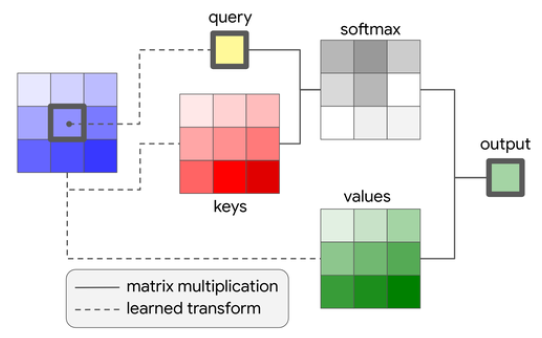


Результат работы Self-Attention после обработки всего изображения. Исходная картинка превратилась в heatmap, с её помощью можно найти нужный сегмент на изображении.

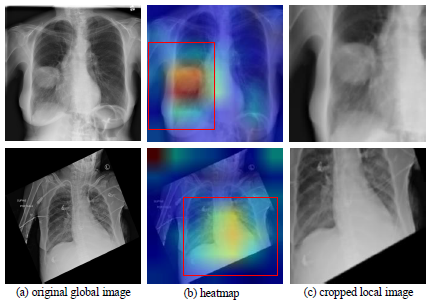

Это решение практически идентично реализации Self-Attention в NLP. Одно важное отличие – отсутствие словаря, который обязательно нужен в задачах с текстом для получения embedding. В данном решении нам хватит итогового пикселя.

### Архитектура модели ViT

Vision Transformer (ViT) - первая работа, демонстрирующая как трансформеры могут
практически заменить стандартные свертки в глубоких нейронных сетях, будучи
обученными на больших наборах изображений.

В ViT применяется исходная модель трансформера (с минимальными изменениями) к
последовательности ''фрагментов'' изображения, сведенных в виде векторов.

Модель была предобучена на большой выборке (JFT датасет, содержащий 300
миллионов изображений) и затем дообучена на ImageNet.

Это важный шаг, поскольку предварительное обучение ViT на наборе данных среднего
размера не даст конкурентоспособных результатов, поскольку CNN кодируют
предварительные знания об изображениях (индуктивные смещения, например,
трансляционную эквивалентность), что снижает потребность в данных по сравнению с
трансформерами, которые должны обнаружить такую информацию из крупной выборки.

Архитектура схожа с теми трансформерами, что используются в NLP, а фрагменты
изображения просто передаются в модель после выравнивания/сведения (англ.
flattening). После обучения признак, полученный из первой позиции токена,
используется для классификации.

![title](vit.png)

## Image classification

Список моделей-трансформеров, способных решать задачу классификации, представлен на Hugging Face. Вот некоторые из них:

* Vision Transformer (ViT), ViT Hybrid, ViTMSN, LeViT
* Data-efficient image transformer (DeiT)
* BERT Pre-Training of Image Transformers (BeiT)
* Convolutional Vision Transformer (CvT)

In [3]:
%pip install transformers datasets evaluate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.6/137.6 kB 1.5 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 5.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 3.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 2.1 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 2.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 388.9/388.9 kB 1.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 1.4 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 773.4/773.4 kB 1.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 1.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6

### Загрузка и предобработка данных

Загружаем для примера датасет со 101 классом, содержащий 101000 изображений (это заняло примерно 40 минут).

In [4]:
from datasets import load_dataset
food = load_dataset("food101", split="train[:5000]")

/home/student1/ml_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Generating validation split: 100%|██████████| 25250/25250 [00:01<00:00, 23675.51 examples/s]


In [5]:
food.save_to_disk('dataset')

Saving the dataset (0/1 shards):   0%|          | 0/5000 [00:00<?, ? examples/s]

Saving the dataset (1/1 shards): 100%|██████████| 5000/5000 [00:00<00:00, 18679.02 examples/s]


In [6]:
food_new = food.train_test_split(test_size=0.2) # разделяем выборку
food_new["train"][0] # смотрим на пример

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=512x384>,
 'label': 81}

In [7]:
# создаем словари, в которых сопоставляем каждому названию класса свой номер


labels = food_new["train"].features["label"].names
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = str(i)
    id2label[str(i)] = label

ramen


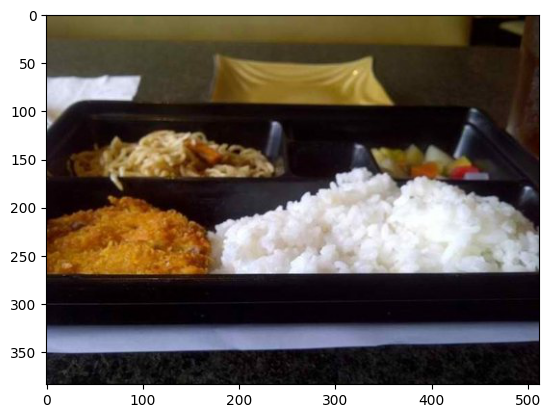

In [8]:
import matplotlib.pyplot as plt

plt.imshow(food_new["train"][0]['image'])

label_name = food_new["train"].features["label"].names[0]
idl = food_new["train"][0]['label']
print (id2label[str(idl)])
 

In [9]:
# занимаемся предобработкой
from transformers import AutoImageProcessor

checkpoint = "google/vit-base-patch16-224-in21k" # название модели
image_processor = AutoImageProcessor.from_pretrained(checkpoint)

2024-04-21 14:04:33.999853: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-21 14:04:34.020124: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-21 14:04:34.020143: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-21 14:04:34.020701: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-21 14:04:34.024211: I tensorflow/core/platform/cpu_feature_guar

In [10]:
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import tensorflow as tf
from PIL import Image

In [12]:
# мы можем совершенно свободно применять инструменты PyTorch или TensorFlow для
# предобработки (кому что удобнее).
size = (image_processor.size["height"], image_processor.size["width"])

train_data_augmentation = keras.Sequential(
    [
        layers.RandomCrop(size[0], size[1]),
        layers.Rescaling(scale=1.0 / 127.5, offset=-1),
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(factor=0.02),
        layers.RandomZoom(height_factor=0.2, width_factor=0.2),
    ],
    name="train_data_augmentation",
)

val_data_augmentation = keras.Sequential(
    [
        layers.CenterCrop(size[0], size[1]),
        layers.Rescaling(scale=1.0 / 127.5, offset=-1),
    ],
    name="val_data_augmentation",
)


def convert_to_tf_tensor(image: Image):
    np_image = np.array(image)
    tf_image = tf.convert_to_tensor(np_image)
    return tf.expand_dims(tf_image, 0)


def preprocess_train(example_batch):
    images = [
        train_data_augmentation(convert_to_tf_tensor(image.convert("RGB"))) for image in example_batch["image"]
    ]
    example_batch["pixel_values"] = [tf.transpose(tf.squeeze(image)) for image in images]
    return example_batch


def preprocess_val(example_batch):
    images = [
        val_data_augmentation(convert_to_tf_tensor(image.convert("RGB"))) for image in example_batch["image"]
    ]
    example_batch["pixel_values"] = [tf.transpose(tf.squeeze(image)) for image in images]
    return example_batch

food_new["train"].set_transform(preprocess_train)
food_new["test"].set_transform(preprocess_val)

from transformers import DefaultDataCollator

data_collator = DefaultDataCollator(return_tensors="tf")

### Обучение и тестирование

In [13]:
import evaluate
import numpy as np
from transformers import create_optimizer
from transformers import TFAutoModelForImageClassification

from tensorflow.keras.losses import SparseCategoricalCrossentropy
from transformers.keras_callbacks import KerasMetricCallback, PushToHubCallback

In [14]:
accuracy = evaluate.load("accuracy")

In [15]:
def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return accuracy.compute(predictions=predictions, references=labels)

In [16]:
batch_size = 16
num_epochs = 5
num_train_steps = len(food_new["train"]) * num_epochs
learning_rate = 3e-5
weight_decay_rate = 0.01

optimizer, lr_schedule = create_optimizer(
    init_lr=learning_rate,
    num_train_steps=num_train_steps,
    weight_decay_rate=weight_decay_rate,
    num_warmup_steps=0,
)

In [17]:
model = TFAutoModelForImageClassification.from_pretrained(
    checkpoint,
    id2label=id2label,
    label2id=label2id,
)

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFViTForImageClassification: ['pooler.dense.bias', 'pooler.dense.weight']
- This IS expected if you are initializing TFViTForImageClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFViTForImageClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFViTForImageClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [18]:
# конвертирование датасетов в датасеты tensorflow

tf_train_dataset = food_new["train"].to_tf_dataset(
    columns="pixel_values", label_cols="label", shuffle=True, batch_size=batch_size, collate_fn=data_collator
)

tf_eval_dataset = food_new["test"].to_tf_dataset(
    columns="pixel_values", label_cols="label", shuffle=True, batch_size=batch_size, collate_fn=data_collator
)

In [19]:
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile(optimizer=optimizer, loss=loss)

### Можно запустить модель на GPU

In [20]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [21]:
model.fit(tf_train_dataset, validation_data=tf_eval_dataset, epochs=num_epochs)

Epoch 1/5
250/250 [==============================] - 843s 3s/step - loss: 2.8135 - val_loss: 1.6466
Epoch 2/5
250/250 [==============================] - 835s 3s/step - loss: 1.2224 - val_loss: 0.8277
Epoch 3/5
250/250 [==============================] - 835s 3s/step - loss: 0.6957 - val_loss: 0.5124
Epoch 4/5
250/250 [==============================] - 836s 3s/step - loss: 0.4880 - val_loss: 0.4117
Epoch 5/5
250/250 [==============================] - 835s 3s/step - loss: 0.3800 - val_loss: 0.3462


In [22]:
# сохраняем веса
model.save_pretrained("vit-classification")

In [23]:
# загружаем веса
model = TFAutoModelForImageClassification.from_pretrained("vit-classification",
                                                          id2label=id2label,
                                                          label2id=label2id)

All model checkpoint layers were used when initializing TFViTForImageClassification.

All the layers of TFViTForImageClassification were initialized from the model checkpoint at vit-classification.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTForImageClassification for predictions without further training.


## Object Detection

### Предобработка и обучение

In [6]:
from datasets import load_dataset
import numpy as np
import os
from PIL import Image, ImageDraw
from transformers import AutoImageProcessor
import albumentations
import numpy as np
import torch
from transformers import AutoModelForObjectDetection
from transformers import TrainingArguments

/home/student1/miniconda3/envs/conda-env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
%pip install datasets
%pip install timm
%pip install accelerate -U
%pip install albumentations

  Using cached datasets-2.19.0-py3-none-any.whl.metadata (19 kB)
  Using cached pyarrow-16.0.0-cp39-cp39-manylinux_2_28_x86_64.whl.metadata (3.0 kB)
  Using cached pyarrow_hotfix-0.6-py3-none-any.whl.metadata (3.6 kB)
  Using cached dill-0.3.8-py3-none-any.whl.metadata (10 kB)
  Using cached pandas-2.2.2-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (19 kB)
  Using cached requests-2.31.0-py3-none-any.whl.metadata (4.6 kB)
  Using cached tqdm-4.66.2-py3-none-any.whl.metadata (57 kB)
  Using cached xxhash-3.4.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (12 kB)
  Using cached multiprocess-0.70.16-py39-none-any.whl.metadata (7.2 kB)
  Using cached aiohttp-3.9.5-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (7.5 kB)
  Using cached huggingface_hub-0.22.2-py3-none-any.whl.metadata (12 kB)
  Using cached aiosignal-1.3.1-py3-none-any.whl.metadata (4.0 kB)
  Using cached attrs-23.2.0-py3-none-any.whl.metadata (9.5 kB)
  Using cached

In [5]:
%pip install transformers

  Using cached transformers-4.40.0-py3-none-any.whl.metadata (137 kB)
  Using cached regex-2024.4.16-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (40 kB)
  Using cached tokenizers-0.19.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.7 kB)
Using cached transformers-4.40.0-py3-none-any.whl (9.0 MB)
Using cached regex-2024.4.16-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (773 kB)
Using cached tokenizers-0.19.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.6 MB)
Note: you may need to restart the kernel to use updated packages.


In [13]:
# загружаем небольшой датасет
cppe5 = load_dataset("cppe-5")
cppe5

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 1000
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 29
    })
})

In [14]:
# каждый объект в данном датасете - словарь с изображением,
# его параметрами и адресами пикселей, относительно которых строятся квадраты, в
# которых присутствуют искомые для детекции объекты
cppe5["train"][0]

{'image_id': 15,
 'image': <PIL.Image.Image image mode=RGB size=943x663>,
 'width': 943,
 'height': 663,
 'objects': {'id': [114, 115, 116, 117],
  'area': [3796, 1596, 152768, 81002],
  'bbox': [[302.0, 109.0, 73.0, 52.0],
   [810.0, 100.0, 57.0, 28.0],
   [160.0, 31.0, 248.0, 616.0],
   [741.0, 68.0, 202.0, 401.0]],
  'category': [4, 4, 0, 0]}}

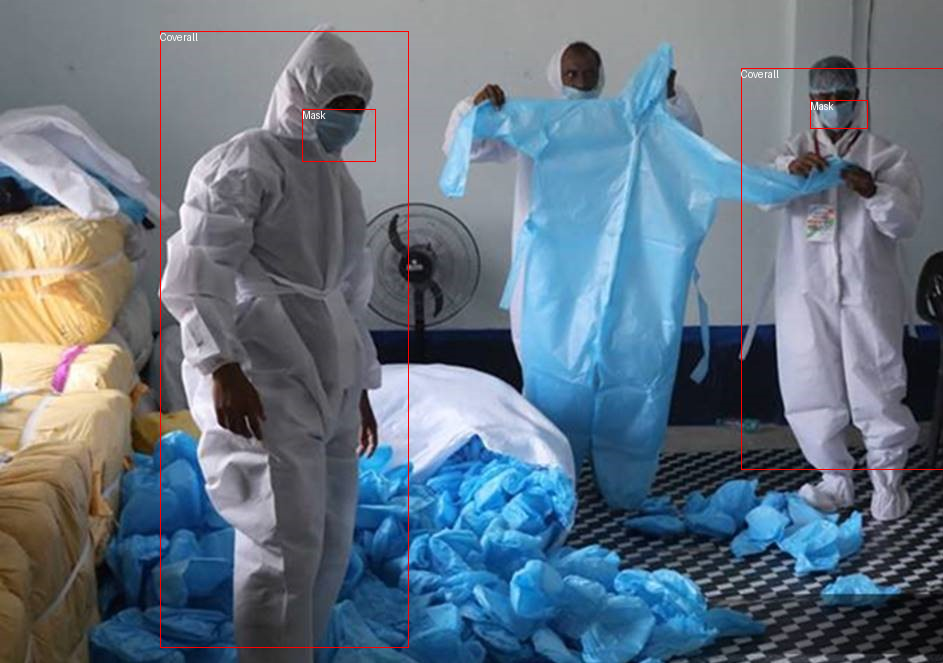

In [15]:
# отрисуем пример для понимания

image = cppe5["train"][0]["image"]
annotations = cppe5["train"][0]["objects"]
draw = ImageDraw.Draw(image)

categories = cppe5["train"].features["objects"].feature["category"].names

id2label = {index: x for index, x in enumerate(categories, start=0)}
label2id = {v: k for k, v in id2label.items()}

for i in range(len(annotations["id"])):
    box = annotations["bbox"][i]
    class_idx = annotations["category"][i]
    x, y, w, h = tuple(box)
    if max(box) > 1.0:
        x1, y1 = int(x), int(y)
        x2, y2 = int(x + w), int(y + h)
    else:
        x1 = int(x * width)
        y1 = int(y * height)
        x2 = int((x + w) * width)
        y2 = int((y + h) * height)
    draw.rectangle((x, y, x + w, y + h), outline="red", width=1)
    draw.text((x, y), id2label[class_idx], fill="white")

image

На последнем этапе ознакомления с данными изучите их на предмет потенциальных проблем. Одной из распространенных проблем с наборами данных для обнаружения объектов являются ограничивающие рамки, которые «выходят» за пределы изображения. Такие «уходящие» ограничивающие рамки могут вызвать ошибки во время обучения, и их следует устранять на этом этапе. В этом наборе данных есть несколько примеров этой проблемы. Чтобы упростить задачу, просто удалим эти изображения из данных.

In [16]:
remove_idx = [590, 821, 822, 875, 876, 878, 879]
keep = [i for i in range(len(cppe5["train"])) if i not in remove_idx]
cppe5["train"] = cppe5["train"].select(keep)

In [17]:
checkpoint = "facebook/detr-resnet-50"
image_processor = AutoImageProcessor.from_pretrained(checkpoint)

In [18]:
# создаем объект преобразований для изображений
transform = albumentations.Compose(
    [
        albumentations.Resize(480, 480),
        albumentations.HorizontalFlip(p=1.0),
        albumentations.RandomBrightnessContrast(p=1.0),
    ],
    bbox_params=albumentations.BboxParams(format="coco", label_fields=["category"]),
)

In [19]:
# преобразуем аннотации
def formatted_anns(image_id, category, area, bbox):
    annotations = []
    for i in range(0, len(category)):
        new_ann = {
            "image_id": image_id,
            "category_id": category[i],
            "isCrowd": 0,
            "area": area[i],
            "bbox": list(bbox[i]),
        }
        annotations.append(new_ann)

    return annotations

# для создания одного батча - скомбинируем изображение и аннотацию
def transform_aug_ann(examples):
    image_ids = examples["image_id"]
    images, bboxes, area, categories = [], [], [], []
    for image, objects in zip(examples["image"], examples["objects"]):
        image = np.array(image.convert("RGB"))[:, :, ::-1]
        out = transform(image=image, bboxes=objects["bbox"], category=objects["category"])

        area.append(objects["area"])
        images.append(out["image"])
        bboxes.append(out["bboxes"])
        categories.append(out["category"])

    targets = [
        {"image_id": id_, "annotations": formatted_anns(id_, cat_, ar_, box_)}
        for id_, cat_, ar_, box_ in zip(image_ids, categories, area, bboxes)
    ]

    return image_processor(images=images, annotations=targets, return_tensors="pt")

In [20]:
# пример того, как осуществляется комбинирование изображения и аннотации
cppe5["train"] = cppe5["train"].with_transform(transform_aug_ann)
cppe5["train"][15]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


{'pixel_values': tensor([[[ 1.4612,  1.4612,  1.4612,  ..., -1.1418, -1.1418, -1.1418],
          [ 1.4612,  1.4612,  1.4612,  ..., -1.1418, -1.1418, -1.1418],
          [ 1.4612,  1.4612,  1.4612,  ..., -1.1247, -1.1247, -1.1247],
          ...,
          [-0.7822, -0.7822, -0.7822,  ..., -1.1589, -1.1589, -1.1589],
          [-0.7650, -0.7650, -0.7650,  ..., -1.1589, -1.1418, -1.1418],
          [-0.7650, -0.7650, -0.7650,  ..., -1.1589, -1.1418, -1.1418]],
 
         [[ 1.8508,  1.8508,  1.8508,  ..., -0.9853, -0.9853, -0.9853],
          [ 1.8508,  1.8508,  1.8508,  ..., -0.9853, -0.9853, -0.9853],
          [ 1.8508,  1.8508,  1.8508,  ..., -0.9678, -0.9678, -0.9678],
          ...,
          [-0.5126, -0.5126, -0.5126,  ..., -1.0028, -1.0028, -1.0028],
          [-0.4951, -0.4951, -0.4951,  ..., -1.0028, -0.9853, -0.9853],
          [-0.4951, -0.4951, -0.4951,  ..., -1.0028, -0.9853, -0.9853]],
 
         [[ 1.9603,  1.9603,  1.9603,  ..., -0.7936, -0.7936, -0.7936],
          [ 

In [21]:
# делаем всё красивее и удобнее
def collate_fn(batch):
    pixel_values = [item["pixel_values"] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item["labels"] for item in batch]
    batch = {}
    batch["pixel_values"] = encoding["pixel_values"]
    batch["pixel_mask"] = encoding["pixel_mask"]
    batch["labels"] = labels
    return batch

In [12]:
# определяем модель (согласно названию в 'checkpoint')
model = AutoModelForObjectDetection.from_pretrained(
    checkpoint,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

In [13]:
# определяем гиперпараметры
training_args = TrainingArguments(
    output_dir="detr-resnet-50_finetuned_cppe5",
    per_device_train_batch_size=8,
    num_train_epochs=10,
    save_steps=200,
    logging_steps=50,
    learning_rate=1e-5,
    weight_decay=1e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=True,
)

Для запуска необходимо использовать токен своего аккаунта на HuggingFace

In [20]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To login, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): Traceback (most recent call last):
  File "/home/student1/ml_env/bin/huggingface-cli", line 8, in <module>
    sys.exit(main())
  File "/home/student1/ml_env/lib/python3.9/site-packages/huggingface_hub/commands/huggingface_cli.py", line 49, in main
    service.run()
  File "/

In [3]:
%pip install torch torchvision torchaudio

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 1.1 MB/s eta 0:00:0000:0100:12
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 1.1 MB/s eta 0:00:0000:0100:010m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 1.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.0/172.0 kB 849.7 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 1.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 1.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.2/133.2 kB 1.5 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 2.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.9 MB/s eta 0:00:0000:0100:05
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 1.8 MB/s eta 0:00:0000:0100:02
     ━━━━━━━━━━━━━━━━━━

In [2]:
%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 757.3/757.3 MB 2.8 MB/s eta 0:00:0000:0100:06
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 3.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 3.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 3.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 4.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.0/154.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 3.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 5.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 4.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 3.0 MB/s eta 0:00:0000:0100:05
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import torch

torch.cuda.is_available()

True

In [9]:
import tensorflow as tf
from tensorflow.python.platform import build_info as build
print(f"tensorflow version: {tf.__version__}")
print(f"Cuda Version: {build.build_info['cuda_version']}")
print(f"Cudnn version: {build.build_info['cudnn_version']}")

2024-04-23 16:28:36.725672: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-23 16:28:36.753989: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-23 16:28:37.302436: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


tensorflow version: 2.16.1
Cuda Version: 12.3
Cudnn version: 8


In [14]:
from transformers import Trainer
import torch.cuda
import torch

model = model.to('cuda')
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    train_dataset=cppe5["train"],
    tokenizer=image_processor,
)

trainer.train()

Step,Training Loss
50,3.471400
100,3.025900
150,2.731500
200,2.451300
250,2.311100
300,2.225200
350,2.186800
400,2.113900
450,2.080100
500,2.042400


TrainOutput(global_step=1250, training_loss=2.151010247802734, metrics={'train_runtime': 908.9533, 'train_samples_per_second': 10.925, 'train_steps_per_second': 1.375, 'total_flos': 4.7447108971776e+18, 'train_loss': 2.151010247802734, 'epoch': 10.0})

### Использование

In [22]:
import json

# форматируем аннотации как для трейн выборки
def val_formatted_anns(image_id, objects):
    annotations = []
    for i in range(0, len(objects["id"])):
        new_ann = {
            "id": objects["id"][i],
            "category_id": objects["category"][i],
            "iscrowd": 0,
            "image_id": image_id,
            "area": objects["area"][i],
            "bbox": objects["bbox"][i],
        }
        annotations.append(new_ann)

    return annotations


# сохраняем изображения и аннотации к ним
def save_cppe5_annotation_file_images(cppe5):
    output_json = {}
    path_output_cppe5 = f"{os.getcwd()}/cppe5/"

    if not os.path.exists(path_output_cppe5):
        os.makedirs(path_output_cppe5)

    path_anno = os.path.join(path_output_cppe5, "cppe5_ann.json")
    categories_json = [{"supercategory": "none", "id": id, "name": id2label[id]} for id in id2label]
    output_json["images"] = []
    output_json["annotations"] = []
    for example in cppe5:
        ann = val_formatted_anns(example["image_id"], example["objects"])
        output_json["images"].append(
            {
                "id": example["image_id"],
                "width": example["image"].width,
                "height": example["image"].height,
                "file_name": f"{example['image_id']}.png",
            }
        )
        output_json["annotations"].extend(ann)
    output_json["categories"] = categories_json

    with open(path_anno, "w") as file:
        json.dump(output_json, file, ensure_ascii=False, indent=4)

    for im, img_id in zip(cppe5["image"], cppe5["image_id"]):
        path_img = os.path.join(path_output_cppe5, f"{img_id}.png")
        im.save(path_img)

    return path_output_cppe5, path_anno

Подготавливаем класс (как это обычно работает в PyTorch) для проверки модели.

Мы можем спокойно определять и обучать модель через TF, а проверять через PyTorch.

In [11]:
%pip install pycocotools

  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.5/159.5 kB 1.3 MB/s eta 0:00:00a 0:00:01
  Using cached pyparsing-3.1.2-py3-none-any.whl.metadata (5.1 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.1/435.1 kB 5.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 4.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 305.0/305.0 kB 1.6 MB/s eta 0:00:00a 0:00:01
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 1.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 1.6 MB/s eta 0:00:0000:0100:01
Using cached pyparsing-3.1.2-py3-none-any.whl (103 kB)
Note: you may need to restart the kernel to use updated packages.


In [23]:
import torchvision


class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, image_processor, ann_file):
        super().__init__(img_folder, ann_file)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        img, target = super(CocoDetection, self).__getitem__(idx)

        # preprocess image and target: converting target to DETR format,
        # resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {"image_id": image_id, "annotations": target}
        encoding = self.image_processor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()  # remove batch dimension
        target = encoding["labels"][0]  # remove batch dimension

        return {"pixel_values": pixel_values, "labels": target}


im_processor = AutoImageProcessor.from_pretrained("devonho/detr-resnet-50_finetuned_cppe5")

path_output_cppe5, path_anno = save_cppe5_annotation_file_images(cppe5["test"])
test_ds_coco_format = CocoDetection(path_output_cppe5, im_processor, path_anno)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [25]:
# загружаем метрики и смотрим что получилось
import evaluate
from tqdm import tqdm

model = AutoModelForObjectDetection.from_pretrained("devonho/detr-resnet-50_finetuned_cppe5")
module = evaluate.load("ybelkada/cocoevaluate", coco=test_ds_coco_format.coco)
val_dataloader = torch.utils.data.DataLoader(
    test_ds_coco_format, batch_size=8, shuffle=False, num_workers=4, collate_fn=collate_fn
)

with torch.no_grad():
    for idx, batch in enumerate(tqdm(val_dataloader)):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]

        labels = [
            {k: v for k, v in t.items()} for t in batch["labels"]
        ]  # these are in DETR format, resized + normalized

        # forward pass
        outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

        orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
        results = im_processor.post_process(outputs, orig_target_sizes)  # convert outputs of model to Pascal VOC format (xmin, ymin, xmax, ymax)

        module.add(prediction=results, reference=labels)
        del batch

results = module.compute()
print(results)

Some weights of the model checkpoint at devonho/detr-resnet-50_finetuned_cppe5 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
100%|██████████| 4/4 [00:40<00:00, 10.04s/it]

Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.326
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.657
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.255
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.173
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.178
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.268
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.468
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.484
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.203
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.301
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

In [26]:
# вот как можно получить результат предсказания модели
with torch.no_grad():
    inputs = image_processor(images=image, return_tensors="pt")
    outputs = model(**inputs)
    target_sizes = torch.tensor([image.size[::-1]])
    results = image_processor.post_process_object_detection(outputs, threshold=0.5, target_sizes=target_sizes)[0]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

Detected Coverall with confidence 0.941 at location [743.55, 42.05, 930.55, 520.94]
Detected Gloves with confidence 0.595 at location [346.8, 387.88, 385.19, 459.58]
Detected Coverall with confidence 0.992 at location [166.78, 26.84, 385.17, 659.71]
Detected Coverall with confidence 0.552 at location [2.35, 205.89, 152.31, 652.92]
Detected Mask with confidence 0.817 at location [303.52, 107.21, 372.33, 152.76]
Detected Coverall with confidence 0.891 at location [425.87, 27.18, 750.37, 515.51]


In [27]:
cppe5 = load_dataset("cppe-5")

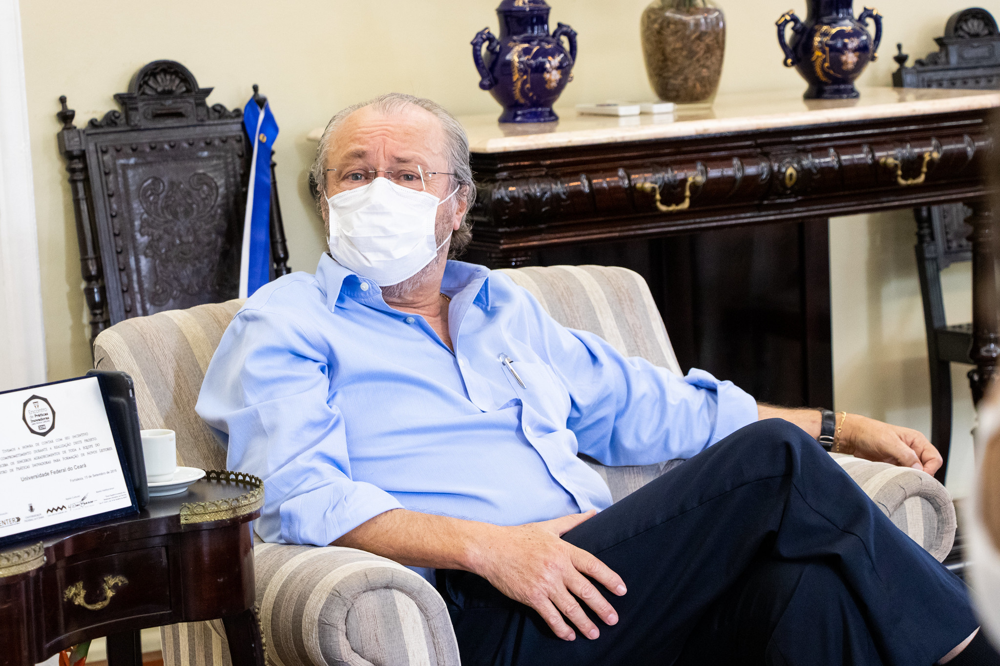

In [28]:
cppe5["train"][4]["image"]

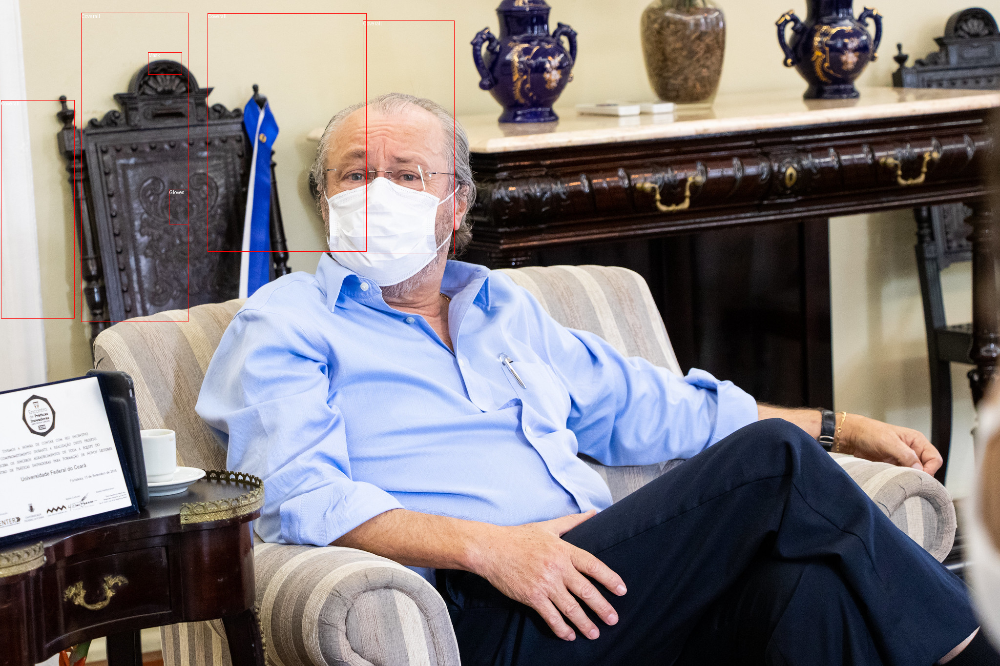

In [29]:
# давай отрисуем пример для лучшей наглядности
example_image = cppe5["train"][4]["image"]
draw = ImageDraw.Draw(example_image)

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    x, y, x2, y2 = tuple(box)
    draw.rectangle((x, y, x2, y2), outline="red", width=1)
    draw.text((x, y), model.config.id2label[label.item()], fill="white")

example_image

## Различные модели трансформеров.

Моделей трансформеров на данный момент уже **очень много**.

Количество моделей в списке доступных для разворачивания и использования моделей
на HuggingFace достигает $258$ штук (тут все, что работают с текстом, с
изображениями, с временными рядами и тд).



Вот некоторые трансформеры, которые работают с изображениями:



### Классификация изображений

* Vision Transformer (ViT), ViT Hybrid, ViTMSN, LeViT
* DeiT
* BeiT
* CvT

### Определение объектов

* DEtection TRansformer (DETR)
* YOLOS (You Only Look at One Sequence)
* Detection Transformers with Assignment (DETA)
* Table Transformer

### Сегментация изображений

* BEiT
* DPT
* MobileViTV2
* SegFormer

### Generative modeling, visual-question Answering and so on

* GPT
* BioGPT
* DialoGPT
* GPT Neo
* GPT-J
* GPTBigCode
* ImageGPT
* ViLT

## Особенности обучения.

Трансформеры, основанные на механизме self-attention, обычно обучаются в два этапа.

Сначала осуществляется предобучение на большом датасете (или комбинации таковых)
с учителем или без учителя. Затем предобученные веса адаптируются к последующим
задачам с использованием малых и средних наборов данных.

Эффективность предобучения на больших датасетах для трансформеров была доказана
как в рамках NLP, так и в CV. Например, у модели ViT-L значение метрики accuracy
падает на 13% на датасете ImageNet, будучи обученным только на тренировочной
выборке ImageNet, по сравнению с обучением на датасете JFT с 300 миллионами
изображений.

Предобучение трансформеров сыграло очень важную роль на качестве их работы, позволяя обучать сети, количество параметров которых доходило до триллионов.

